# LOCKED POSITION RANDOMIZED DATA

FILENAME: budget_randomized.ipynb
    
PROJECT: Randomized Data Model

DATE CREATED: 27-MAY-20

DATE UPDATED: 3-AUG-20

## PHASE 1: PROJECT SETUP

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

Import the necessary libraries needed for ETL, engineering, and export efforts

In [2]:
import pandas as pd
import csv
import random
import sqlite3
import itertools
import numpy as np
import datetime
from itertools import repeat
import time as t
import getpass as gp

# plotting modules
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as po
import plotly.graph_objects as go

import networkx as nx

Create a function which creates a dataframe with a length 'df_length' and randomizes the distribution of values as each year progresses

- Column names include: 'projects', 'subprojects', 'programs', 'rca'
- Budget years include:  'year 3 forecast', 'year 2 forecast', 'year 1 forecast', 'planned value', 'appropriation value', 'obligated value'



In [3]:
def init_array(df_length):
    '''
    DESCRIPTION: A function to create and return a two_dimensional array with randomized float values
    '''
    
    length = df_length
    
    num_of_projects = 20 # can change the amount of projects
    num_of_subprojects = 40 # can change the amount of subprojects
    num_of_programs = 80
    num_of_rca = 120 # can change the amount of RCAs
    
    # create a sequential list of column values for projects, subprojects, and RCAs
    proj_list = ['project-' + str(i+1) for i in range(num_of_projects)] # create a list of project names
    subproject_list = ['subproject-' + str(i+1) for i in range(num_of_subprojects)]
    program_list = ['program-' + str(i+1) for i in range(num_of_programs)]
    rca_list = ['rca-' + str(i+1) for i in range(num_of_rca)]
    
    project_values = []
    subproject_values = []
    program_values = []
    rca_values = []

    for index in range(length):
        
        # select a random value from each list
        proj_val = random.choice(proj_list)
        sb_val = (random.choice(subproject_list))
        program_val = random.choice(program_list)
        rca_val = random.choice(rca_list)
        
        # append the randomized value to the default list
        project_values.append(proj_val)
        subproject_values.append(sb_val)
        program_values.append(program_val)
        rca_values.append(rca_val)
    
    # create randomized budget data
    yr3_forecast= np.random.randint(low = 1000, high = 30000, size = df_length) 
    yr2_random = np.random.uniform(low=0.5, high=1.3, size=df_length)
    yr2_forecast = np.round(yr3_forecast * yr2_random,2)
    
    yr1_random = np.random.uniform(low=0.8, high=1.2, size=df_length)
    yr1_forecast = np.round(yr2_forecast * yr1_random,2)
    
    plan_random = np.random.uniform(low=0.6, high=1.3, size=df_length)
    plan_val = np.round(yr1_forecast * plan_random,2)
    
    approp_random = np.random.uniform(low=0.6, high=1.2, size=df_length)
    approp_val = np.round(plan_val * approp_random,2)
    
    oblig_random = np.random.uniform(low=0.8, high=1.0, size=df_length)
    oblig_val = np.round(approp_val * oblig_random,2)
    
    raw_df = pd.DataFrame(columns=['project', 'subproject', 'program_title', 'rca','yr+3_forecast','yr+2_forecast','yr+1_forecast','yr0_plan','yr-1_approp','yr-2_oblig'])

    raw_df['project'] = project_values
    raw_df['subproject'] = subproject_values
    raw_df['program_title'] = program_values
    raw_df['rca'] = rca_values
    raw_df['yr+3_forecast'] = yr3_forecast
    raw_df['yr+2_forecast'] = yr2_forecast
    raw_df['yr+1_forecast'] = yr1_forecast
    raw_df['yr0_plan'] = plan_val
    raw_df['yr-1_approp'] = approp_val
    raw_df['yr-2_oblig'] = oblig_val
    
    return raw_df

Sankey visualization function - used to plot data located in the passed dataframe argument

In [4]:
def genSankey(df,cat_cols=[],value_cols='',title='Sankey Diagram'):
    # maximum of 6 value cols -> 6 colors
    colorPalette = ['#4B8BBE','#306998','#FFE873','#FFD43B','#646464']
    labelList = []
    colorNumList = []
    for catCol in cat_cols:
        labelListTemp =  list(set(df[catCol].values))
        colorNumList.append(len(labelListTemp))
        labelList = labelList + labelListTemp
        
    # remove duplicates from labelList
    labelList = list(dict.fromkeys(labelList))
    
    # define colors based on number of levels
    colorList = []
    for idx, colorNum in enumerate(colorNumList):
        colorList = colorList + [colorPalette[idx]]*colorNum
        
    # transform df into a source-target pair
    for i in range(len(cat_cols)-1):
        if i==0:
            sourceTargetDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            sourceTargetDf.columns = ['source','target','count']
        else:
            tempDf = df[[cat_cols[i],cat_cols[i+1],value_cols]]
            tempDf.columns = ['source','target','count']
            sourceTargetDf = pd.concat([sourceTargetDf,tempDf])
        sourceTargetDf = sourceTargetDf.groupby(['source','target']).agg({'count':'sum'}).reset_index()
        
    # add index for source-target pair
    sourceTargetDf['sourceID'] = sourceTargetDf['source'].apply(lambda x: labelList.index(x))
    sourceTargetDf['targetID'] = sourceTargetDf['target'].apply(lambda x: labelList.index(x))
    
    # creating the sankey diagram
    data = dict(
        type='sankey',
        node = dict(
          pad = 15,
          thickness = 20,
          line = dict(
            color = "black",
            width = 0.5
          ),
          label = labelList,
          color = colorList
        ),
        link = dict(
          source = sourceTargetDf['sourceID'],
          target = sourceTargetDf['targetID'],
          value = sourceTargetDf['count']
        )
      )
    
    layout =  dict(
        title = title,
        font = dict(
          size = 10
        )
    )
       
    fig = dict(data=[data], layout=layout)
    return fig



# PHASE 2: FUNCTION TEST

Invoke the 'init_array' function in order to create a sample budgetary data set

In [5]:
train_df = init_array(10000)
train_df.tail(10)

,project,subproject,program_title,rca,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig
9990,project-1,subproject-36,program-32,rca-73,11463,14036.75,15525.01,13251.83,15302.91,13219.70
9991,project-15,subproject-31,program-34,rca-43,20798,26338.79,21660.72,27647.34,21363.02,19560.52
9992,project-7,subproject-22,program-75,rca-119,16689,11128.25,13074.19,16124.59,13993.26,11699.49
9993,project-20,subproject-34,program-65,rca-3,2304,2662.73,2171.67,1821.52,1439.45,1253.88
9994,project-8,subproject-39,program-70,rca-68,21387,12581.45,14479.07,18133.19,16278.07,15972.24
9995,project-7,subproject-36,program-42,rca-94,17083,20058.69,20922.04,21492.29,16227.91,14719.53
9996,project-20,subproject-20,program-68,rca-20,13512,9029.56,9381.80,7081.99,7789.38,6318.44
9997,project-10,subproject-27,program-17,rca-31,26149,18282.70,20424.68,14512.40,10871.69,9378.23
9998,project-12,subproject-24,program-30,rca-72,22693,15229.96,18272.47,21007.20,20353.86,19873.24
9999,project-20,subproject-9,program-71,rca-24,3631,2053.22,2437.67,1936.75,1762.25,1618.66


Create a unique key based on the concatenation of the 'project', 'subproject', 'program_title', 'rca' column values

In [6]:
train_df['key'] = train_df['project'] + '-' + train_df['subproject'] + '-' + train_df['program_title'] + '-' + train_df['rca']
train_df['key']


0       project-17-subproject-25-program-28-rca-43
1        project-13-subproject-7-program-18-rca-97
2        project-13-subproject-9-program-74-rca-47
3       project-11-subproject-12-program-18-rca-61
4        project-3-subproject-7-program-67-rca-115
                           ...                    
9995     project-7-subproject-36-program-42-rca-94
9996    project-20-subproject-20-program-68-rca-20
9997    project-10-subproject-27-program-17-rca-31
9998    project-12-subproject-24-program-30-rca-72
9999     project-20-subproject-9-program-71-rca-24
Name: key, Length: 10000, dtype: object

Remove duplicate rows as a way to mitigate collisions

In [7]:
key_df = train_df[['key']]
duplicateRowsDF = key_df[key_df.duplicated()]
 
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

print("Total count of duplicated rows :")
print(len(duplicateRowsDF))

Duplicate Rows except first occurrence based on all columns are :
                                             key
2377  project-10-subproject-18-program-48-rca-84
2508   project-3-subproject-7-program-67-rca-115
2837   project-2-subproject-5-program-21-rca-118
4963   project-1-subproject-10-program-77-rca-37
5501    project-5-subproject-1-program-66-rca-64
5694  project-13-subproject-11-program-58-rca-32
6840  project-6-subproject-28-program-28-rca-108
7737   project-9-subproject-16-program-45-rca-55
8412   project-10-subproject-5-program-78-rca-53
9294  project-11-subproject-21-program-33-rca-99
9556   project-6-subproject-15-program-72-rca-81
Total count of duplicated rows :
11


Dropping all duplicte 'key' values 

In [8]:
train_df.drop_duplicates(subset ="key", 
                     keep = False, inplace = True) 


In [9]:
key_df = train_df[['key']]
duplicateRowsDF = key_df[key_df.duplicated()]
 
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF)

print("\nTotal count of duplicated rows :",len(duplicateRowsDF))


Duplicate Rows except first occurrence based on all columns are :
Empty DataFrame
Columns: [key]
Index: []

Total count of duplicated rows : 0


### Store unique values in data structures

Create a list of all column names for future iteration activities

In [10]:
budget_col_names = list(train_df.columns)
budget_col_names

['project',
 'subproject',
 'program_title',
 'rca',
 'yr+3_forecast',
 'yr+2_forecast',
 'yr+1_forecast',
 'yr0_plan',
 'yr-1_approp',
 'yr-2_oblig',
 'key']

In [11]:
budget_ordinal_names = budget_col_names[:4]
budget_ordinal_names

['project', 'subproject', 'program_title', 'rca']

In [12]:
budget_quant_names = budget_col_names[4:10]
budget_quant_names

['yr+3_forecast',
 'yr+2_forecast',
 'yr+1_forecast',
 'yr0_plan',
 'yr-1_approp',
 'yr-2_oblig']

In [13]:
proj_uniq_values = train_df['project'].unique()
print(set(proj_uniq_values))

{'project-19', 'project-9', 'project-20', 'project-2', 'project-3', 'project-8', 'project-14', 'project-1', 'project-5', 'project-11', 'project-10', 'project-7', 'project-16', 'project-6', 'project-17', 'project-4', 'project-18', 'project-15', 'project-12', 'project-13'}


In [14]:
subproj_uniq_values = train_df['subproject'].unique()
print(set(subproj_uniq_values))

{'subproject-25', 'subproject-17', 'subproject-16', 'subproject-33', 'subproject-10', 'subproject-13', 'subproject-31', 'subproject-36', 'subproject-15', 'subproject-27', 'subproject-1', 'subproject-7', 'subproject-11', 'subproject-8', 'subproject-32', 'subproject-3', 'subproject-21', 'subproject-30', 'subproject-23', 'subproject-20', 'subproject-26', 'subproject-12', 'subproject-29', 'subproject-39', 'subproject-6', 'subproject-14', 'subproject-2', 'subproject-24', 'subproject-37', 'subproject-34', 'subproject-28', 'subproject-19', 'subproject-22', 'subproject-9', 'subproject-35', 'subproject-4', 'subproject-40', 'subproject-5', 'subproject-18', 'subproject-38'}


In [15]:
program_uniq_values = train_df['program_title'].unique()
print(set(program_uniq_values))

{'program-12', 'program-46', 'program-4', 'program-42', 'program-33', 'program-78', 'program-16', 'program-47', 'program-80', 'program-71', 'program-29', 'program-74', 'program-36', 'program-23', 'program-26', 'program-40', 'program-58', 'program-63', 'program-64', 'program-11', 'program-21', 'program-25', 'program-44', 'program-14', 'program-54', 'program-28', 'program-59', 'program-9', 'program-56', 'program-24', 'program-19', 'program-77', 'program-20', 'program-48', 'program-57', 'program-50', 'program-27', 'program-31', 'program-41', 'program-1', 'program-7', 'program-5', 'program-52', 'program-72', 'program-8', 'program-49', 'program-43', 'program-60', 'program-75', 'program-53', 'program-15', 'program-17', 'program-70', 'program-6', 'program-69', 'program-10', 'program-34', 'program-62', 'program-51', 'program-22', 'program-55', 'program-39', 'program-66', 'program-76', 'program-18', 'program-65', 'program-2', 'program-79', 'program-61', 'program-3', 'program-67', 'program-37', 

In [16]:
rca_uniq_values = train_df['rca'].unique()
print(set(rca_uniq_values))

{'rca-109', 'rca-2', 'rca-114', 'rca-83', 'rca-85', 'rca-52', 'rca-86', 'rca-69', 'rca-100', 'rca-63', 'rca-64', 'rca-45', 'rca-47', 'rca-108', 'rca-117', 'rca-9', 'rca-54', 'rca-101', 'rca-106', 'rca-120', 'rca-6', 'rca-72', 'rca-80', 'rca-12', 'rca-73', 'rca-36', 'rca-66', 'rca-97', 'rca-111', 'rca-67', 'rca-105', 'rca-91', 'rca-42', 'rca-5', 'rca-49', 'rca-65', 'rca-28', 'rca-115', 'rca-88', 'rca-43', 'rca-11', 'rca-8', 'rca-55', 'rca-98', 'rca-25', 'rca-16', 'rca-74', 'rca-82', 'rca-113', 'rca-14', 'rca-20', 'rca-103', 'rca-92', 'rca-17', 'rca-7', 'rca-99', 'rca-61', 'rca-94', 'rca-33', 'rca-79', 'rca-23', 'rca-107', 'rca-112', 'rca-38', 'rca-29', 'rca-35', 'rca-39', 'rca-27', 'rca-77', 'rca-75', 'rca-34', 'rca-87', 'rca-90', 'rca-51', 'rca-118', 'rca-68', 'rca-62', 'rca-10', 'rca-119', 'rca-71', 'rca-81', 'rca-46', 'rca-116', 'rca-22', 'rca-102', 'rca-48', 'rca-104', 'rca-56', 'rca-70', 'rca-58', 'rca-50', 'rca-1', 'rca-3', 'rca-95', 'rca-40', 'rca-31', 'rca-24', 'rca-37', 'rca-53

### Visualize the generated data set

'Project' Title Visualization

In [17]:
for col_name in budget_col_names:
    
    raw_val = train_df[[col_name]]
    
    chart_title = col_name + ' Histogram'
    xaxis_title = col_name + ' Counts'
    yaxis_title = 'Frequency'
    
    # plot the histogram
    fig = px.histogram(raw_val, x=col_name, marginal="box", # can be `box`, `violin`
                   nbins=12)
    fig.update_layout(
        title = chart_title,
        autosize=False,
        width=1500,
        height=700,
        margin=dict(
            l=50,
            r=50,
            b=100,
            t=100,
            pad=4
            ),
        paper_bgcolor="white",
    )
    fig.show()

### Visualize Ordinal  Records

In [18]:

col_df = train_df[['project', 'yr-2_oblig']]

sum_df = col_df.groupby('project').sum()

sum_df

,yr-2_oblig
project,
project-1,5300979.71
project-10,5643618.27
project-11,5531636.22
project-12,5379556.76
project-13,5017303.66
project-14,5441481.86
project-15,5163038.25
project-16,5889026.35
project-17,5235769.43


In [19]:
for col_name in budget_ordinal_names:
    
        col_df = train_df[[col_name, 'yr-2_oblig']]

        sum_df = col_df.groupby(col_name).sum().reset_index()
        sort_df = sum_df.sort_values(by='yr-2_oblig', ascending=True)
        
        chart_title = col_name + ' Summary'

        xaxis_title = col_name 
        yaxis_title = 'Total by yr-2_oblig'

        # plot the histogram
        fig = px.bar(sort_df, x='yr-2_oblig', y=col_name, orientation='h', color='yr-2_oblig',)

        fig.update_layout(
            title = chart_title,
            autosize=False,
            width=1500,
            height=700,
            margin=dict(
                l=50,
                r=50,
                b=100,
                t=100,
                pad=4
                ),
            paper_bgcolor="white",
        )
        fig.show()

### Network X Graph Visualization

#### Project to Subproject network graph

In [20]:
proj_list = train_df['project'].to_list()
subproj_list = train_df['subproject'].to_list()

graph_df = train_df[['project', 'subproject']]
graph_df

,project,subproject
0,project-17,subproject-25
1,project-13,subproject-7
2,project-13,subproject-9
3,project-11,subproject-12
5,project-9,subproject-40
...,...,...
9995,project-7,subproject-36
9996,project-20,subproject-20
9997,project-10,subproject-27
9998,project-12,subproject-24


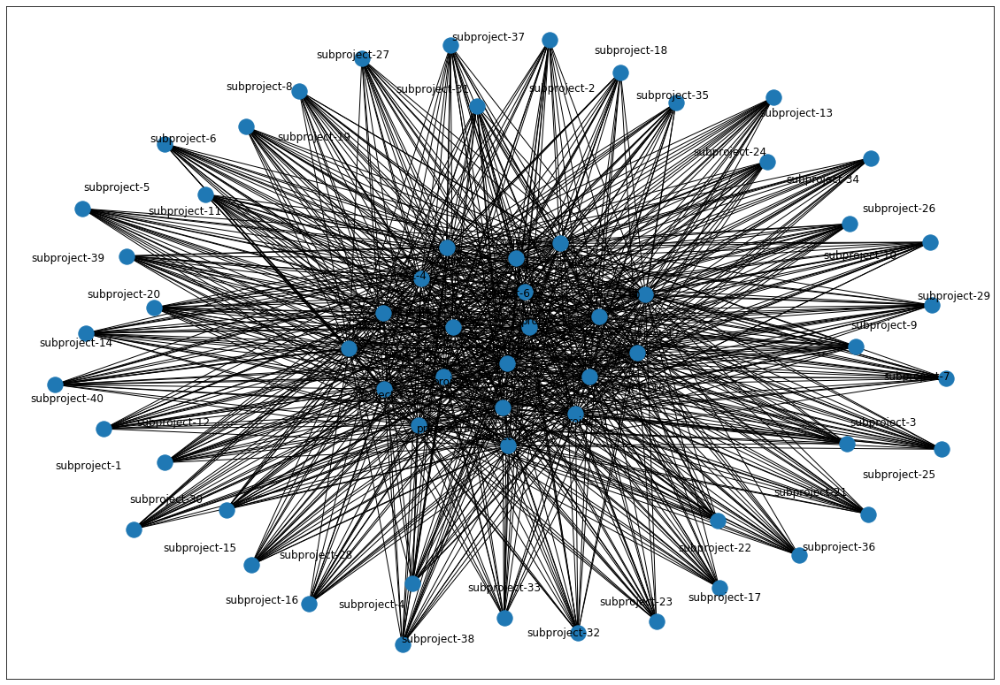

In [102]:
G=nx.from_pandas_edgelist(graph_df, 'project', 'subproject')

plt.figure(figsize = (20,14))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos=pos)
nx.draw_networkx_edges(G, pos=pos)
labels=nx.draw_networkx_labels(G,pos=nx.spring_layout(G))

Generate Sankey visualization

In [22]:
sum_df = train_df.groupby(['project', 'subproject', 'yr-2_oblig']).sum().reset_index()

fig = genSankey(sum_df,cat_cols=['project', 'subproject'],value_cols='yr-2_oblig',title='Project to Subproject Analysis')
po.offline.plot(fig, validate=False)

'temp-plot.html'

#### Subproject to Program List network graph

In [23]:
subproj_list = train_df['subproject'].to_list()
prog_list = train_df['program_title'].to_list()

graph_df_2 = train_df[['subproject', 'program_title']]
graph_df_2

,subproject,program_title
0,subproject-25,program-28
1,subproject-7,program-18
2,subproject-9,program-74
3,subproject-12,program-18
5,subproject-40,program-52
...,...,...
9995,subproject-36,program-42
9996,subproject-20,program-68
9997,subproject-27,program-17
9998,subproject-24,program-30


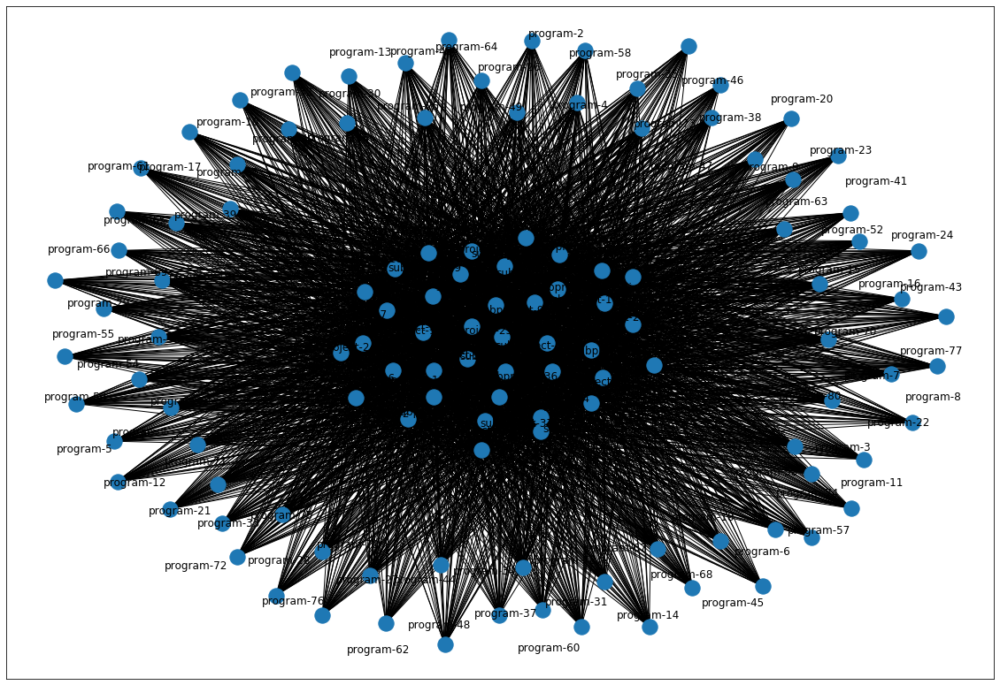

In [103]:
G=nx.from_pandas_edgelist(graph_df_2, 'subproject', 'program_title')

plt.figure(figsize = (20,14))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos=pos)
nx.draw_networkx_edges(G, pos=pos)
labels=nx.draw_networkx_labels(G,pos=nx.spring_layout(G))

### Generate the sankey analysis 

Only retrieve the first 500 records

In [50]:
train_200 = train_df[:200].copy()

In [104]:
sum_df = train_200.groupby(['project', 'subproject', 'yr-2_oblig']).sum().reset_index()

fig = genSankey(sum_df,cat_cols=['project', 'subproject'],value_cols='yr-2_oblig',title='Project to Subproject Analysis')
po.offline.plot(fig, validate=False)

'temp-plot.html'

# PHASE 3: RANDOMIZE EXECUTION DATA 

Section to build out the test data and functions

Create a shallow copy of the completed 'train_df' dataframe in order to conducted stand alone financial execution data analysis

In [26]:
exe_df = train_df.copy()
exe_df.head(5)

,project,subproject,program_title,rca,yr+3_forecast,yr+2_forecast,yr+1_forecast,yr0_plan,yr-1_approp,yr-2_oblig,key
0,project-17,subproject-25,program-28,rca-43,23120,23512.49,27334.64,24274.03,21391.98,18967.79,project-17-subproject-25-program-28-rca-43
1,project-13,subproject-7,program-18,rca-97,11243,8188.85,9379.27,6334.09,5844.71,5837.39,project-13-subproject-7-program-18-rca-97
2,project-13,subproject-9,program-74,rca-47,20890,11092.19,10907.86,8923.75,6104.97,5385.64,project-13-subproject-9-program-74-rca-47
3,project-11,subproject-12,program-18,rca-61,8027,6844.49,7804.37,9525.98,9679.82,7790.18,project-11-subproject-12-program-18-rca-61
5,project-9,subproject-40,program-52,rca-60,10736,10325.46,10278.06,8496.57,5703.30,4583.48,project-9-subproject-40-program-52-rca-60


Extract only the needed categorical columns

In [27]:
exe_slice = exe_df[['key','project','subproject','program_title','rca','yr0_plan']]
exe_slice = exe_slice.rename(columns={'yr0_plan': "usd_value"})
exe_slice.head(5)

,key,project,subproject,program_title,rca,usd_value
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57


In [28]:
exe_slice['month'] = '12'
exe_slice['year'] = '2019'
exe_slice.head(5)

,key,project,subproject,program_title,rca,usd_value,month,year
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019


Create a list of randomized obligated values for month ending 9-30-2019

In [29]:
df_len = len(exe_slice)
eoy_oblig = [random.uniform(0.9, 1.0) for x in range(df_len)]
eoy_oblig

[0.9181605508693322,
 0.9611075787843391,
 0.9316828006487822,
 0.9144089880807441,
 0.9389974416558721,
 0.9808373612113327,
 0.9454748177830143,
 0.9804542270173267,
 0.9031960116858339,
 0.9553658008374152,
 0.9452566205782564,
 0.9904907368497583,
 0.9907406134774976,
 0.9771939830709828,
 0.9994628080687723,
 0.9780023092489503,
 0.9605037170058454,
 0.916349783785113,
 0.9985440023552271,
 0.9833369238641935,
 0.982872682750223,
 0.9921182469123763,
 0.9510733006291024,
 0.9174436512758957,
 0.9066153664066867,
 0.9887208584500542,
 0.9711086032638164,
 0.9418055994279667,
 0.9303833570118885,
 0.9149481628223382,
 0.9308979294451369,
 0.9406007642139592,
 0.989370561898848,
 0.9250936689164548,
 0.9219992536221345,
 0.9760955424202739,
 0.993794338009372,
 0.9795426927269518,
 0.9863823694410762,
 0.9060378621087458,
 0.9001014110660089,
 0.9485596792620827,
 0.9193691007022211,
 0.97541508200379,
 0.9501774441644467,
 0.9648842659095956,
 0.9406143032922838,
 0.9661900140661839

Calculate the end of year obligation values

In [30]:
exe_slice['oblig'] = exe_slice['usd_value'] * eoy_oblig
exe_slice

,key,project,subproject,program_title,rca,usd_value,month,year,oblig
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493
...,...,...,...,...,...,...,...,...,...
9995,project-7-subproject-36-program-42-rca-94,project-7,subproject-36,program-42,rca-94,21492.29,12,2019,21266.698892
9996,project-20-subproject-20-program-68-rca-20,project-20,subproject-20,program-68,rca-20,7081.99,12,2019,6844.666370
9997,project-10-subproject-27-program-17-rca-31,project-10,subproject-27,program-17,rca-31,14512.40,12,2019,14068.267824
9998,project-12-subproject-24-program-30-rca-72,project-12,subproject-24,program-30,rca-72,21007.20,12,2019,19198.500246


Create the execution burn rate values

In [75]:
eoy_exe = [random.uniform(0.6, .9) for x in range(df_len)]
eoy_exe

[0.8290014035315322,
 0.6855073902958166,
 0.6504641841884996,
 0.668501880644874,
 0.7481394970400251,
 0.8646695236186916,
 0.7993492268232868,
 0.7693683232698164,
 0.764070096336465,
 0.7745782969685316,
 0.8316125493236615,
 0.8983527077678533,
 0.895993872604135,
 0.7974821939118042,
 0.8696236404914646,
 0.6321027032205336,
 0.8179888368675496,
 0.6407685772918325,
 0.8053383843305055,
 0.6507129301555626,
 0.6716450480248555,
 0.6378546020069813,
 0.8924602058212241,
 0.8351377727776086,
 0.7305498881425674,
 0.6828227643245488,
 0.7039678197288268,
 0.681048235515531,
 0.6405602127170728,
 0.6229939895442823,
 0.841762290526644,
 0.8295628538584368,
 0.8367691310285938,
 0.7489839160935151,
 0.8656530909907372,
 0.7599642723608705,
 0.762137027317392,
 0.8135261433457543,
 0.6323489116912165,
 0.7607774171799813,
 0.7105839341566882,
 0.8572200381800572,
 0.8425511400294121,
 0.8660718447899415,
 0.763830289273698,
 0.8002768336372048,
 0.8349533284330929,
 0.8525689538286684,

Calculate the obligation and execution rates at the month level

In [78]:
exe_slice['total_authority'] = exe_slice['oblig']
exe_slice['executed'] = exe_slice['oblig'] * eoy_exe
exe_slice[:10]

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757,18476.332932
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904,4173.192065
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392,5408.027131
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732,5823.080380
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493,5968.849548
6,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,4275.97,12,2019,4194.031131,4194.031131,3626.450900
7,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,4217.86,12,2019,3987.880415,3987.880415,3187.709126
8,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,29461.19,12,2019,28885.348268,28885.348268,22223.471964
9,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,15799.72,12,2019,14270.244090,14270.244090,10903.466776
10,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,13843.24,12,2019,13225.358069,13225.358069,10244.075330


Create a list of 'key' values

In [79]:
key_list = list(exe_slice['key'])
key_list

['project-17-subproject-25-program-28-rca-43',
 'project-13-subproject-7-program-18-rca-97',
 'project-13-subproject-9-program-74-rca-47',
 'project-11-subproject-12-program-18-rca-61',
 'project-9-subproject-40-program-52-rca-60',
 'project-14-subproject-6-program-15-rca-85',
 'project-17-subproject-25-program-37-rca-61',
 'project-9-subproject-10-program-67-rca-108',
 'project-10-subproject-9-program-35-rca-92',
 'project-7-subproject-13-program-77-rca-69',
 'project-5-subproject-2-program-76-rca-88',
 'project-8-subproject-11-program-80-rca-62',
 'project-15-subproject-29-program-61-rca-94',
 'project-8-subproject-31-program-71-rca-69',
 'project-15-subproject-19-program-22-rca-26',
 'project-13-subproject-5-program-69-rca-34',
 'project-10-subproject-35-program-1-rca-56',
 'project-3-subproject-6-program-69-rca-112',
 'project-19-subproject-1-program-3-rca-28',
 'project-8-subproject-10-program-41-rca-41',
 'project-4-subproject-39-program-65-rca-25',
 'project-17-subproject-4-prog

In [80]:
exe_slice.dtypes

key                 object
project             object
subproject          object
program_title       object
rca                 object
usd_value          float64
month               object
year                object
oblig              float64
total_authority    float64
executed           float64
dtype: object

## Test one key for the timeseries for loop

Extract the first value from the master dataframe

In [81]:
temp = exe_slice[:1]
temp

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757,18476.332932


In [83]:
for month in range(11): # iterate through the remaining 11 months of the calendar year
    
    print("top of the loop")
    display(temp)
    current_month = 11 - month
    print("Current month: ", current_month)
    
    forward_month = int(current_month) + 1
    print("Forward month: ", forward_month)
    
    converted_month = str(forward_month)
    print("Converted month: ", converted_month)
    
    month_cond = temp['month'].str.startswith(converted_month, na=False) 

    temp_row = temp[month_cond]
    display(temp_row)
    #display(temp_row.iat[0,0])

    key_val = temp.iat[month,0]
    print(key_val)
    
    # assign the project value
    project_val = temp.iat[month,1]
    print(project_val)
    
    # assign the subproject value
    subproject_val = temp.iat[month,2]
    print(subproject_val)
    
    # assign the program value
    program_val = temp.iat[month,3]
    print(program_val)
    
    # assign the rca value
    rca_val = temp.iat[month,4]
    print(rca_val)
    
    # assign the forward month obligation value
    forward_oblig_val = temp.iat[month,8]
    print(forward_oblig_val)

    # assign the current month obligation value
    current_oblig_val = forward_oblig_val * .8
    print(current_oblig_val)
    
    # assign the forward month execution value
    forward_exe_val = temp.iat[month,10]
    print(forward_exe_val)

    # assign the current month execution value
    current_exe_val = forward_oblig_val * .7
    print(current_exe_val)
    
    ta_val = temp.iat[month,9]
    print(ta_val)

    usd_val = 0
    temp = temp.append(pd.DataFrame([[key_val,project_val,subproject_val,program_val,rca_val,usd_val, current_month, '2019', current_oblig_val,ta_val, current_exe_val]], columns=temp.columns))
    print('\nAdded row\n')

    

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757,18476.332932


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757,18476.332932


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
18476.33293238523
15601.219729633087
22287.456756618696

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757,18476.332932
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757,15601.219730


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
17829.96540529496
14263.972324235969
15601.219729633087
12480.97578370647
22287.456756618696

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757,18476.332932
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757,15601.219730
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,10,2019,14263.972324,22287.456757,12480.975784


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
14263.972324235969
11411.177859388776
12480.97578370647
9984.780626965177
22287.456756618696

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757,18476.332932
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757,15601.219730
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,10,2019,14263.972324,22287.456757,12480.975784
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,9,2019,11411.177859,22287.456757,9984.780627


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
11411.177859388776
9128.942287511021
9984.780626965177
7987.824501572142
22287.456756618696

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757,18476.332932
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757,15601.219730
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,10,2019,14263.972324,22287.456757,12480.975784
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,9,2019,11411.177859,22287.456757,9984.780627
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,8,2019,9128.942288,22287.456757,7987.824502


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
9128.942287511021
7303.153830008818
7987.824501572142
6390.259601257714
22287.456756618696

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757,18476.332932
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757,15601.219730
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,10,2019,14263.972324,22287.456757,12480.975784
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,9,2019,11411.177859,22287.456757,9984.780627
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,8,2019,9128.942288,22287.456757,7987.824502
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,7,2019,7303.153830,22287.456757,6390.259601


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
7303.153830008818
5842.523064007055
6390.259601257714
5112.207681006172
22287.456756618696

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757,18476.332932
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757,15601.219730
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,10,2019,14263.972324,22287.456757,12480.975784
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,9,2019,11411.177859,22287.456757,9984.780627
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,8,2019,9128.942288,22287.456757,7987.824502
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,7,2019,7303.153830,22287.456757,6390.259601
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,6,2019,5842.523064,22287.456757,5112.207681


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
5842.523064007055
4674.018451205644
5112.207681006172
4089.766144804938
22287.456756618696

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757,18476.332932
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757,15601.219730
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,10,2019,14263.972324,22287.456757,12480.975784
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,9,2019,11411.177859,22287.456757,9984.780627
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,8,2019,9128.942288,22287.456757,7987.824502
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,7,2019,7303.153830,22287.456757,6390.259601
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,6,2019,5842.523064,22287.456757,5112.207681
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,5,2019,4674.018451,22287.456757,4089.766145


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
4674.018451205644
3739.2147609645153
4089.766144804938
3271.8129158439506
22287.456756618696

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757,18476.332932
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757,15601.219730
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,10,2019,14263.972324,22287.456757,12480.975784
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,9,2019,11411.177859,22287.456757,9984.780627
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,8,2019,9128.942288,22287.456757,7987.824502
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,7,2019,7303.153830,22287.456757,6390.259601
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,6,2019,5842.523064,22287.456757,5112.207681
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,5,2019,4674.018451,22287.456757,4089.766145
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,4,2019,3739.214761,22287.456757,3271.812916


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
3739.2147609645153
2991.3718087716125
3271.8129158439506
2617.4503326751606
22287.456756618696

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757,18476.332932
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757,15601.219730
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,10,2019,14263.972324,22287.456757,12480.975784
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,9,2019,11411.177859,22287.456757,9984.780627
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,8,2019,9128.942288,22287.456757,7987.824502
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,7,2019,7303.153830,22287.456757,6390.259601
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,6,2019,5842.523064,22287.456757,5112.207681
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,5,2019,4674.018451,22287.456757,4089.766145
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,4,2019,3739.214761,22287.456757,3271.812916
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,3,2019,2991.371809,22287.456757,2617.450333


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
2991.3718087716125
2393.09744701729
2617.4503326751606
2093.9602661401286
22287.456756618696

Added row

top of the loop


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757,18476.332932
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757,15601.219730
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,10,2019,14263.972324,22287.456757,12480.975784
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,9,2019,11411.177859,22287.456757,9984.780627
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,8,2019,9128.942288,22287.456757,7987.824502
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,7,2019,7303.153830,22287.456757,6390.259601
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,6,2019,5842.523064,22287.456757,5112.207681
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,5,2019,4674.018451,22287.456757,4089.766145
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,4,2019,3739.214761,22287.456757,3271.812916
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,3,2019,2991.371809,22287.456757,2617.450333


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
2393.09744701729
1914.4779576138321
2093.9602661401286
1675.168212912103
22287.456756618696

Added row



Calculate utilization percentages

In [89]:
temp['oblig_ta_rate'] = temp['oblig'] / temp['total_authority']
temp['exe_ta_rate'] = temp['executed'] / temp['total_authority']
temp['exe_oblig_rate'] = temp['executed'] / temp['oblig']

temp

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority,executed,oblig_ta_rate,exe_ta_rate,exe_oblig_rate
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757,18476.332932,1.000000,0.829001,0.829001
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757,15601.219730,0.800000,0.700000,0.875000
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,10,2019,14263.972324,22287.456757,12480.975784,0.640000,0.560000,0.875000
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,9,2019,11411.177859,22287.456757,9984.780627,0.512000,0.448000,0.875000
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,8,2019,9128.942288,22287.456757,7987.824502,0.409600,0.358400,0.875000
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,7,2019,7303.153830,22287.456757,6390.259601,0.327680,0.286720,0.875000
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,6,2019,5842.523064,22287.456757,5112.207681,0.262144,0.229376,0.875000
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,5,2019,4674.018451,22287.456757,4089.766145,0.209715,0.183501,0.875000
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,4,2019,3739.214761,22287.456757,3271.812916,0.167772,0.146801,0.875000
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,3,2019,2991.371809,22287.456757,2617.450333,0.134218,0.117441,0.875000


Melt the quant columns to two columns, 'variable' and 'value'

In [85]:
plot_temp = temp[['month', 'oblig', 'total_authority', 'executed']].reset_index()
df_waterfall = pd.melt(plot_temp, id_vars=["month"], value_vars=["oblig", "total_authority", 'executed'])
df_waterfall

,month,variable,value
0,12,oblig,22287.456757
1,11,oblig,17829.965405
2,10,oblig,14263.972324
3,9,oblig,11411.177859
4,8,oblig,9128.942288
5,7,oblig,7303.153830
6,6,oblig,5842.523064
7,5,oblig,4674.018451
8,4,oblig,3739.214761
9,3,oblig,2991.371809


Sort the values by month and variable, descending

In [87]:
sorted_df = df_waterfall.sort_values(by=['month', 'variable'])
sorted_df

,month,variable,value
35,1,executed,1675.168213
11,1,oblig,1914.477958
23,1,total_authority,22287.456757
34,2,executed,2093.960266
10,2,oblig,2393.097447
22,2,total_authority,22287.456757
33,3,executed,2617.450333
9,3,oblig,2991.371809
21,3,total_authority,22287.456757
32,4,executed,3271.812916


Create the plotly chart

In [88]:

fig = px.bar(sorted_df, y='value', x='month', color = 'variable', title = "Execution, Obligation, and Total Authority Summary")
fig.update_layout(barmode='group')
fig.show()

### Visualize the utilization percentages at the RCA level

In [90]:
plot_temp = temp[['month', 'oblig_ta_rate', 'exe_ta_rate', 'exe_oblig_rate']].reset_index()
df_util = pd.melt(plot_temp, id_vars=["month"], value_vars=['oblig_ta_rate', 'exe_ta_rate', 'exe_oblig_rate'])
df_util

,month,variable,value
0,12,oblig_ta_rate,1.000000
1,11,oblig_ta_rate,0.800000
2,10,oblig_ta_rate,0.640000
3,9,oblig_ta_rate,0.512000
4,8,oblig_ta_rate,0.409600
5,7,oblig_ta_rate,0.327680
6,6,oblig_ta_rate,0.262144
7,5,oblig_ta_rate,0.209715
8,4,oblig_ta_rate,0.167772
9,3,oblig_ta_rate,0.134218


In [91]:
sorted_util = df_util.sort_values(by=['month', 'variable'])
sorted_util

,month,variable,value
35,1,exe_oblig_rate,0.875000
23,1,exe_ta_rate,0.075162
11,1,oblig_ta_rate,0.085899
34,2,exe_oblig_rate,0.875000
22,2,exe_ta_rate,0.093952
10,2,oblig_ta_rate,0.107374
33,3,exe_oblig_rate,0.875000
21,3,exe_ta_rate,0.117441
9,3,oblig_ta_rate,0.134218
32,4,exe_oblig_rate,0.875000


Plot the utilization rates for the given key

In [100]:
fig = px.line(sorted_util, y='value', x='month', color = 'variable', title = "Utilization Rate Summary for 'project-17-subproject-25-program-28-rca-43'", width=1000, height=700)

fig.update_layout(barmode='group')
fig.data[0].update(mode='markers+lines')
fig.data[1].update(mode='markers+lines')
fig.data[2].update(mode='markers+lines')

fig.show()

## Consolidated timeseries generated loop

In [38]:
temp2 = exe_slice.copy()
temp2[:5]

,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493


In [39]:
for key in key_list[:20]:
    
    for month in range(11): # iterate through the remaining 11 months of the calendar year

        print("Beginning start of the new month ... ")
        display(temp2)
        current_month = 11 - month
        print("Current month: ", current_month)

        forward_month = int(current_month) + 1
        print("Forward month: ", forward_month)

        converted_month = str(forward_month)
        print("Converted month: ", converted_month)

        month_cond = temp2['month'].str.startswith(converted_month, na=False) 
        key_cond = temp2['key'].str.startswith(key, na=False)
        temp_row = temp2[month_cond & key_cond]
        display(temp_row)
        #display(temp_row.iat[0,0])

        key_val = temp2.iat[month,0]
        print(key_val)

        project_val = temp2.iat[month,1]
        print(project_val)

        #subproject_val = temp_row.get_value(0, 'subproject') 
        subproject_val = temp2.iat[month,2]
        print(subproject_val)

        #program_val = temp_row.get_value(0, 'program_title') 
        program_val = temp2.iat[month,3]
        print(program_val)

        #rca_val = temp_row.get_value(0, 'rca') 
        rca_val = temp2.iat[month,4]
        print(rca_val)

        #forward_oblig_val = temp_row.get_value(0, 'oblig') 
        forward_oblig_val = temp2.iat[month,8]
        print(forward_oblig_val)

        current_oblig_val = forward_oblig_val * .8
        print(current_oblig_val)

        ta_val = temp2.iat[month,9]
        print(ta_val)

        usd_val = 0
        temp2 = temp2.append(pd.DataFrame([[key_val,project_val,subproject_val,program_val,rca_val,usd_val, current_month, '2019', current_oblig_val,ta_val]], columns=temp.columns))
        print('\nAdded month row, restarting inner loop ... \n')



Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
9995,project-7-subproject-36-program-42-rca-94,project-7,subproject-36,program-42,rca-94,21492.29,12,2019,21266.698892,21266.698892
9996,project-20-subproject-20-program-68-rca-20,project-20,subproject-20,program-68,rca-20,7081.99,12,2019,6844.666370,6844.666370
9997,project-10-subproject-27-program-17-rca-31,project-10,subproject-27,program-17,rca-31,14512.40,12,2019,14068.267824,14068.267824
9998,project-12-subproject-24-program-30-rca-72,project-12,subproject-24,program-30,rca-72,21007.20,12,2019,19198.500246,19198.500246


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
9996,project-20-subproject-20-program-68-rca-20,project-20,subproject-20,program-68,rca-20,7081.99,12,2019,6844.666370,6844.666370
9997,project-10-subproject-27-program-17-rca-31,project-10,subproject-27,program-17,rca-31,14512.40,12,2019,14068.267824,14068.267824
9998,project-12-subproject-24-program-30-rca-72,project-12,subproject-24,program-30,rca-72,21007.20,12,2019,19198.500246,19198.500246
9999,project-20-subproject-9-program-71-rca-24,project-20,subproject-9,program-71,rca-24,1936.75,12,2019,1759.343950,1759.343950


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
9997,project-10-subproject-27-program-17-rca-31,project-10,subproject-27,program-17,rca-31,14512.40,12,2019,14068.267824,14068.267824
9998,project-12-subproject-24-program-30-rca-72,project-12,subproject-24,program-30,rca-72,21007.20,12,2019,19198.500246,19198.500246
9999,project-20-subproject-9-program-71-rca-24,project-20,subproject-9,program-71,rca-24,1936.75,12,2019,1759.343950,1759.343950
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
9998,project-12-subproject-24-program-30-rca-72,project-12,subproject-24,program-30,rca-72,21007.20,12,2019,19198.500246,19198.500246
9999,project-20-subproject-9-program-71-rca-24,project-20,subproject-9,program-71,rca-24,1936.75,12,2019,1759.343950,1759.343950
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
9999,project-20-subproject-9-program-71-rca-24,project-20,subproject-9,program-71,rca-24,1936.75,12,2019,1759.343950,1759.343950
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
6,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,4275.97,12,2019,4194.031131,4194.031131


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
7,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,4217.86,12,2019,3987.880415,3987.880415


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
8,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,29461.19,12,2019,28885.348268,28885.348268


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
9,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,15799.72,12,2019,14270.24409,14270.24409


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
10,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,13843.24,12,2019,13225.358069,13225.358069


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
11,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,2126.1,12,2019,2009.710101,2009.710101


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
12,project-8-subproject-11-program-80-rca-62,project-8,subproject-11,program-80,rca-62,8399.14,12,2019,8319.270368,8319.270368


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
13,project-15-subproject-29-program-61-rca-94,project-15,subproject-29,program-61,rca-94,18546.54,12,2019,18374.810417,18374.810417


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
14,project-8-subproject-31-program-71-rca-69,project-8,subproject-31,program-71,rca-69,7581.77,12,2019,7408.860025,7408.860025


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
15,project-15-subproject-19-program-22-rca-26,project-15,subproject-19,program-22,rca-26,6310.53,12,2019,6307.140034,6307.140034


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
16,project-13-subproject-5-program-69-rca-34,project-13,subproject-5,program-69,rca-34,1074.2,12,2019,1050.570081,1050.570081


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
17,project-10-subproject-35-program-1-rca-56,project-10,subproject-35,program-1,rca-56,6447.73,12,2019,6193.068631,6193.068631


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
18,project-3-subproject-6-program-69-rca-112,project-3,subproject-6,program-69,rca-112,25117.55,12,2019,23016.461512,23016.461512


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
19,project-19-subproject-1-program-3-rca-28,project-19,subproject-1,program-3,rca-28,6351.71,12,2019,6342.461925,6342.461925


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069


Current month:  11
Forward month:  12
Converted month:  12


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
20,project-8-subproject-10-program-41-rca-41,project-8,subproject-10,program-41,rca-41,12345.33,12,2019,12139.618826,12139.618826


project-17-subproject-25-program-28-rca-43
project-17
subproject-25
program-28
rca-43
22287.456756618696
17829.96540529496
22287.456756618696

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101


Current month:  10
Forward month:  11
Converted month:  11


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-7-program-18-rca-97
project-13
subproject-7
program-18
rca-97
6087.7419037020945
4870.193522961676
6087.7419037020945

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757


Current month:  9
Forward month:  10
Converted month:  10


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-13-subproject-9-program-74-rca-47
project-13
subproject-9
program-74
rca-47
8314.10439228957
6651.283513831656
8314.10439228957

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-7-subproject-13-program-77-rca-69,project-7,subproject-13,program-77,rca-69,0.00,2,2019,10580.286455,13225.358069
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904


Current month:  8
Forward month:  9
Converted month:  9


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-11-subproject-12-program-18-rca-61
project-11
subproject-12
program-18
rca-61
8710.641732277407
6968.513385821926
8710.641732277407

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-5-subproject-2-program-76-rca-88,project-5,subproject-2,program-76,rca-88,0.00,1,2019,1607.768081,2009.710101
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392


Current month:  7
Forward month:  8
Converted month:  8


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-40-program-52-rca-60
project-9
subproject-40
program-52
rca-60
7978.257492850033
6382.605994280027
7978.257492850033

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,0.00,11,2019,17829.965405,22287.456757
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732


Current month:  6
Forward month:  7
Converted month:  7


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-14-subproject-6-program-15-rca-85
project-14
subproject-6
program-15
rca-85
4194.031131418823
3355.2249051350586
4194.031131418823

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,0.00,10,2019,4870.193523,6087.741904
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493


Current month:  5
Forward month:  6
Converted month:  6


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-17-subproject-25-program-37-rca-61
project-17
subproject-25
program-37
rca-61
3987.8804149342645
3190.304331947412
3987.8804149342645

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,0.00,9,2019,6651.283514,8314.104392
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131


Current month:  4
Forward month:  5
Converted month:  5


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-9-subproject-10-program-67-rca-108
project-9
subproject-10
program-67
rca-108
28885.34826846059
23108.278614768475
28885.34826846059

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,0.00,8,2019,6968.513386,8710.641732
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415


Current month:  3
Forward month:  4
Converted month:  4


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-10-subproject-9-program-35-rca-92
project-10
subproject-9
program-35
rca-92
14270.244089752903
11416.195271802324
14270.244089752903

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,0.00,7,2019,6382.605994,7978.257493
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268


Current month:  2
Forward month:  3
Converted month:  3


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-7-subproject-13-program-77-rca-69
project-7
subproject-13
program-77
rca-69
13225.358068784539
10580.286455027632
13225.358068784539

Added month row, restarting inner loop ... 

Beginning start of the new month ... 


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority
0,project-17-subproject-25-program-28-rca-43,project-17,subproject-25,program-28,rca-43,24274.03,12,2019,22287.456757,22287.456757
1,project-13-subproject-7-program-18-rca-97,project-13,subproject-7,program-18,rca-97,6334.09,12,2019,6087.741904,6087.741904
2,project-13-subproject-9-program-74-rca-47,project-13,subproject-9,program-74,rca-47,8923.75,12,2019,8314.104392,8314.104392
3,project-11-subproject-12-program-18-rca-61,project-11,subproject-12,program-18,rca-61,9525.98,12,2019,8710.641732,8710.641732
5,project-9-subproject-40-program-52-rca-60,project-9,subproject-40,program-52,rca-60,8496.57,12,2019,7978.257493,7978.257493
...,...,...,...,...,...,...,...,...,...,...
0,project-14-subproject-6-program-15-rca-85,project-14,subproject-6,program-15,rca-85,0.00,6,2019,3355.224905,4194.031131
0,project-17-subproject-25-program-37-rca-61,project-17,subproject-25,program-37,rca-61,0.00,5,2019,3190.304332,3987.880415
0,project-9-subproject-10-program-67-rca-108,project-9,subproject-10,program-67,rca-108,0.00,4,2019,23108.278615,28885.348268
0,project-10-subproject-9-program-35-rca-92,project-10,subproject-9,program-35,rca-92,0.00,3,2019,11416.195272,14270.244090


Current month:  1
Forward month:  2
Converted month:  2


,key,project,subproject,program_title,rca,usd_value,month,year,oblig,total_authority


project-5-subproject-2-program-76-rca-88
project-5
subproject-2
program-76
rca-88
2009.7101010114309
1607.7680808091447
2009.7101010114309

Added month row, restarting inner loop ... 



# END OF PROGRAM

"Si vacem para bellum"

# TEST SECTION

In [40]:
num_exe_proj = 15
num_exe_subproj = 30
num_exe_rca = 50
num_exe_program = 75

num_of_kc = 10
is_base = 1
is_nip = 1

In [41]:
exe_proj_list = ['proj-' + str(x) for x in range(num_exe_proj)]
exe_proj_list[:5]

['proj-0', 'proj-1', 'proj-2', 'proj-3', 'proj-4']

In [42]:
exe_subproj_list = ['subproj-' + str(x) for x in range(num_exe_subproj)]
exe_subproj_list[:5]

['subproj-0', 'subproj-1', 'subproj-2', 'subproj-3', 'subproj-4']

In [43]:
exe_rca_list = ['rca-' + str(x) for x in range(num_exe_rca)]
exe_rca_list[:5]

['rca-0', 'rca-1', 'rca-2', 'rca-3', 'rca-4']

In [44]:
exe_prog_list = ['program-' + str(x) for x in range(num_exe_program)]
exe_prog_list[:5]

['program-0', 'program-1', 'program-2', 'program-3', 'program-4']

# PHASE 4: EXPORT DATA

In [45]:
train_df.to_csv(r'locked_random_data_v1', index = False)